#Introduction

The aim of this project is to get familiar with **Mixture of Gaussians** model.




In [1]:
import os
import numpy as np
import scipy
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
from IPython import display
%matplotlib inline

For this project, we will use the Peterson and Barney’s dataset of vowel formant frequencies.

More specifically, Peterson and Barney measured the fundamental frequency $F0$ and the first three formant frequencies ($F1-F3$) of sustained English Vowels, using samples from various speakers.

Upload the .npy file and load it using the code block below.

In [2]:
from google.colab import files
files.upload()
data_npy_file = 'PB_data.npy'

# Loading data from .npy file
data = np.load(data_npy_file, allow_pickle=True)

Saving PB_data.npy to PB_data.npy


In [3]:
data

array({'f3': array([2850, 2790, 2640, ..., 3380, 2160, 2200], dtype=uint16), 'f2': array([2280, 2400, 2030, ..., 1140, 1850, 1830], dtype=uint16), 'f1': array([240, 280, 390, ..., 500, 740, 660], dtype=uint16), 'f0': array([160, 186, 203, ..., 334, 308, 328], dtype=uint16), 'phoneme_id': array([ 1,  1,  2, ...,  9, 10, 10], dtype=uint8)},
      dtype=object)

The dataset contains 4 vectors ($F0-F3$), containing the fundamental frequencies ($F0$, $F1$, $F2$ and $F3$) for each phoneme and another vector “phoneme\_id” containing a number representing the id of the phoneme.

We will use only the dataset associated with formants $F1$ and $F2$.

**Note**: Phonemes and Frequencies are two different things; phoneme_id is the ground truth class of each row while frequencies represent features of each data point.

In [4]:
data = np.ndarray.tolist(data)
# Array that contains the phoneme ID (1-10) of each sample
phoneme_id = data['phoneme_id']

# frequencies f1 and f2
f1 = data['f1']
f2 = data['f2']

### <font color="red"> We will produce a plot of $F1$ against $F2$. We are analyzing on the figure and the visible clusters. </font>

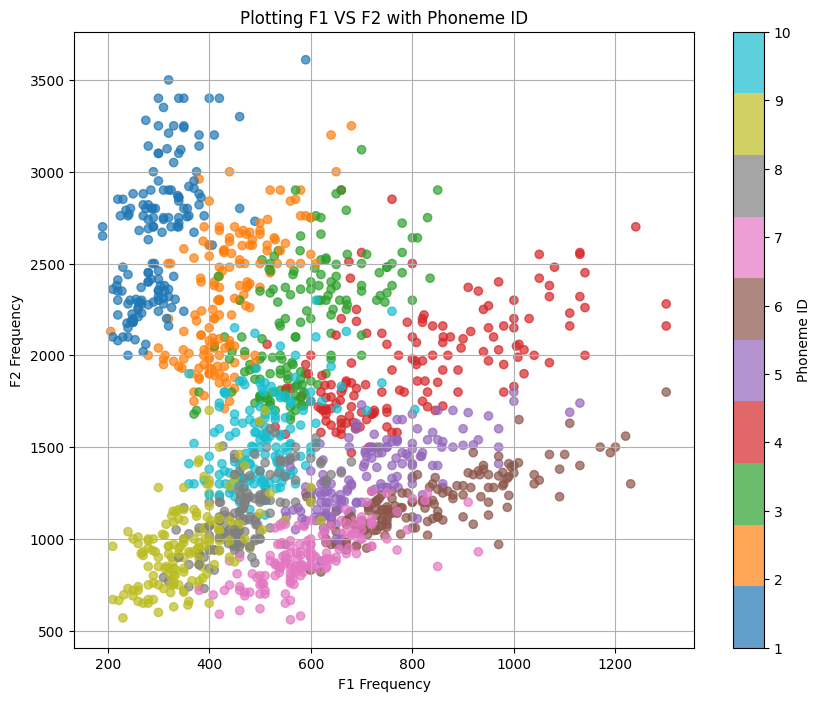

In [5]:
### your code here
plt.figure(figsize=(10, 8))
plt.scatter(f1, f2, c=phoneme_id, cmap='tab10', alpha=0.7)
plt.title('Plotting F1 VS F2 with Phoneme ID')
plt.xlabel('F1 Frequency')
plt.ylabel('F2 Frequency')
plt.colorbar(label='Phoneme ID')
plt.grid(True)
plt.show()

# 1. MoG Using the EM algorithm

Recalling the following definition of a Mixture of Gaussians. Assuming our observed random vector is $\mathbf{x}\in\mathbb{R}^D$, a MoG models $p(\mathbf{x})$ as a sum of $K$-many weighted Gaussians. More specifically:


\begin{equation}
 p(\mathbf{x}) = \sum_{k=1}^K \frac{p(c_{k})}{(2\pi)^{D/2} \mathrm{det}\left(\boldsymbol\Sigma_k\right)^{1/2}}
 % \exp(-\frac{1}{2}(x-\mu)^T \sum_{k}^{-1}(x-\mu))
 \exp\left(-\frac{1}{2}(\mathbf{x}-\boldsymbol\mu_k)^\top {\boldsymbol\Sigma_k}^{-1}(\mathbf{x}-\boldsymbol\mu_k)\right),
\end{equation}
where:
* $\boldsymbol\mu_k\in\mathbb{R}^{D}$
* $\boldsymbol\Sigma_{k}\in\mathbb{R}^{D\times D}$
* $p(c_{k})=\pi_k\in\mathbb{R}$

denote the $k$-th gaussian component's **mean vector**, **covariance matrix**, and **mixture coefficients** respectively. The $K$-many gaussian components' model parameters are referred to collectively as $\theta = \{\boldsymbol\mu_k,\boldsymbol\Sigma_{k},\pi_k\}_{k=1}^K$.

## EM Algorithm
For the E step we softly assign each datum to the closest centroid (using the current iteration's fixed model parameters) as in the K means example.

For the M step we update the model parameters $\theta$ to maximize the weighted log-likelihood.
At a high level, for each centroid k we:
* Update the mean vectors
* Update the covariance matrices (We will fit Gaussians with diagonal covariance matrices)
* Set the mixture coefficients as the mean probability of a sample being generated by the k-th gaussian component

#The function below computes the probability density of each data point in X under each component of the GMM. This is a key step in many GMM-related tasks, such as clustering or density estimation. The output Z can be used to assign data points to the most likely component or to compute the likelihood of the data under the GMM.

In [6]:
def get_predictions(mu, s, p, X):
	"""
		:param mu			: means of GMM components
		:param s			: covariances of GMM components
		:param p 			: weights of GMM components
		:param X			: 2D array of our dataset
	"""

	# get number of GMM components
	k = s.shape[0]
	# get number of data samples
	N = X.shape[0]
	# get dimensionality of our dataset
	D = X.shape[1]

	Z = np.zeros((N, k))
	for i in range(k):
		mu_i = mu[i, :]
		mu_i = np.expand_dims(mu_i, axis=1)
		mu_i_repeated = np.repeat(mu_i, N, axis=1)
		X_minus_mu = X - mu_i_repeated.transpose()
		inverse_s = scipy.linalg.pinv(s[i])
		inverse_s = np.squeeze(inverse_s)
		s_i_det = scipy.linalg.det(s[i])
		x_s_x = np.matmul(X_minus_mu, inverse_s)*X_minus_mu
		Z[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))
	return Z



### Helper functions

In [7]:
def plot_gaussians(ax, s, mu, X, title_string):
    """
        :param X            : 2D array of our dataset
        :param y            : 1D array of the groundtruth labels of the dataset
        :param ax          : existing subplot, to draw on it
    """
    ax.clear()
    if X.shape[1] == 2:
        # set label of horizontal axis
        ax.set_xlabel('f1')
        # set label of vertical axis
        ax.set_ylabel('f2')
        # scatter the points, with red color
        ax.scatter(X[:,0], X[:,1], c='black', marker='.', label=title_string)

    k = s.shape[0]
    color_list = ['r', 'g', 'b', 'c', 'm', 'y']
    N_sides = 11

    # Iterate over all gaussians
    for k_cnt in range(k):

        # pick the covariance matrix and mean values of each gaussian
        s_k = s[k_cnt]
        mu_k = mu[k_cnt]

        if s_k.shape[0]==2:
            # dataset with 2 features
            side_range = np.arange(0, N_sides, 1)
            theta = side_range/(N_sides-1)*2*np.pi
            matrix = np.array([np.cos(theta), np.sin(theta)])
            mu_k = np.expand_dims(mu_k, axis=1)
            mu_repeated = np.repeat(mu_k, N_sides, axis=1)
            epoints = np.matmul(scipy.linalg.sqrtm(s_k), matrix) + mu_repeated
            plt.plot(epoints[0,:], epoints[1,:], color=color_list[k_cnt], linewidth=2)
            plt.scatter(mu_k[0], mu_k[1], color=color_list[k_cnt], marker='o', linewidth=2)
        elif s_k.shape[0]==3:
            # dataset with 3 features
            side_range = np.arange(0, N_sides, 1)
            theta = side_range/(N_sides-1)*np.pi
            phi = side_range/(N_sides-1)*2*np.pi
            sin_theta = np.expand_dims(np.sin(theta), axis=1)
            cos_theta = np.expand_dims(np.cos(theta), axis=1)
            sin_phi = np.expand_dims(np.sin(phi), axis=1)
            cos_phi = np.expand_dims(np.cos(phi), axis=1)
            sx = np.matmul(sin_theta, cos_phi.transpose())
            sy = np.matmul(sin_theta, sin_phi.transpose())
            sz = np.matmul(cos_theta, np.ones((1, N_sides)))
            svect = np.array([sx.reshape((N_sides*N_sides)), sy.reshape((N_sides*N_sides)), sz.reshape((N_sides*N_sides))])

            mu_k = np.expand_dims(mu_k, axis=1)
            mu_repeated = np.repeat(mu_k, N_sides*N_sides, axis=1)
            epoints = np.matmul(scipy.linalg.sqrtm(s_k), svect) + mu_repeated

            ex = epoints[0]
            ey = epoints[1]
            ez = epoints[2]

            ax.plot3D(epoints[0,:], epoints[1,:], epoints[2,:], color=color_list[k_cnt])
            ax.plot3D(ex, ey, ez, color=color_list[k_cnt])
        else:
            print('Each dataset sample should have either 2 or 3 features. Not plotting this one.')
    ax.legend()
    display.clear_output(wait=True)
    display.display(plt.gcf())

def plot_data_3D(X, title_string, ax):
    """
        :param X            : 2D array of our dataset
        :param y            : 1D array of the groundtruth labels of the dataset
        :param ax          : existing subplot, to draw on it
    """
    # clear subplot from previous (if any) drawn stuff
    ax.clear()
    # set label of x axis
    ax.set_xlabel('f1')
    # set label of y axis
    ax.set_ylabel('f2')
    # set label of z axis
    ax.set_zlabel('f1 + f2')
    # scatter the points, with red color
    ax.scatter3D(X[:,0], X[:,1], X[:,2], c='black', marker='.', label=title_string)
    # add legend to the subplot
    ax.legend()


def save_model(mu, s, p):
  GMM_parameters = {}
  GMM_parameters['mu'] = mu
  GMM_parameters['s'] = s
  GMM_parameters['p'] = p
  if not os.path.isdir('data/'):
    os.mkdir('data/')
  npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
  np.save(npy_filename, GMM_parameters)

## Training MoG


In [8]:
## initialising k = 3 and p_id = 1 ##
k =3
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 1
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

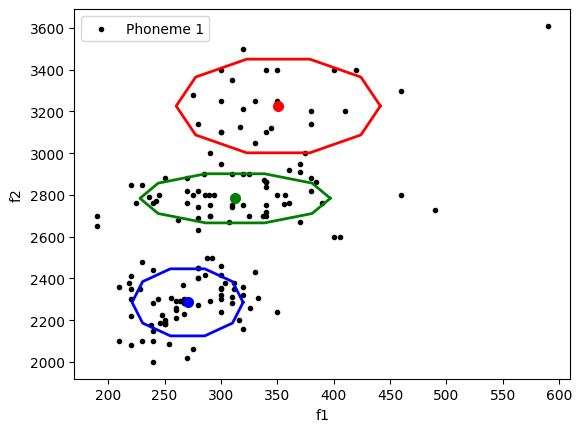


Finished.

[[ 350.84372 3226.3125 ]
 [ 312.59015 2783.893  ]
 [ 270.3952  2285.4653 ]] [[[ 4102.74096986     0.        ]
  [    0.         27836.43520787]]

 [[ 3562.61478752     0.        ]
  [    0.          7657.18477968]]

 [[ 1213.73821897     0.        ]
  [    0.         14278.42716697]]]


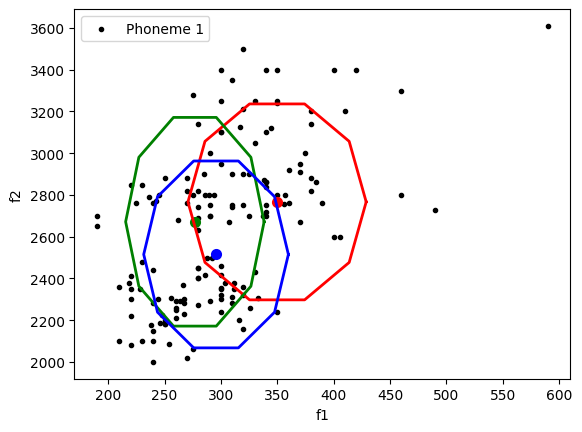

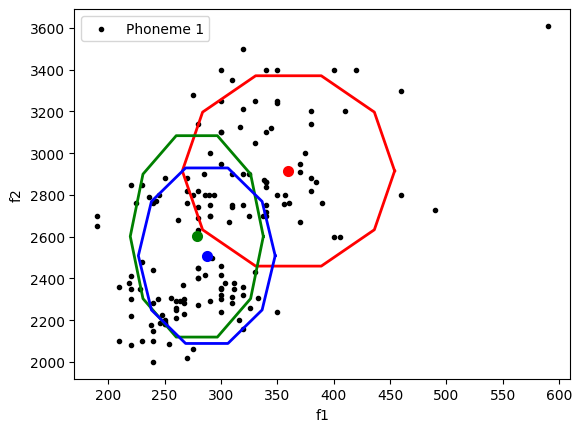

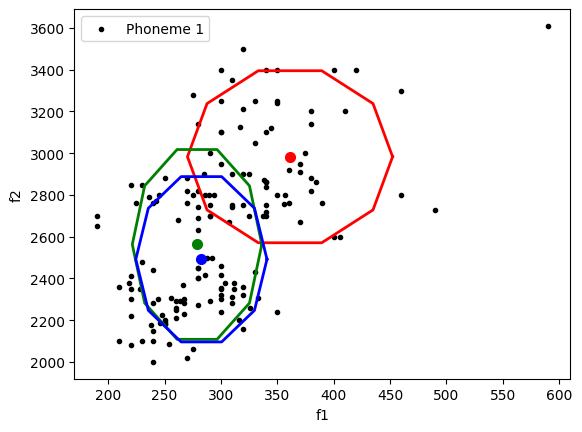

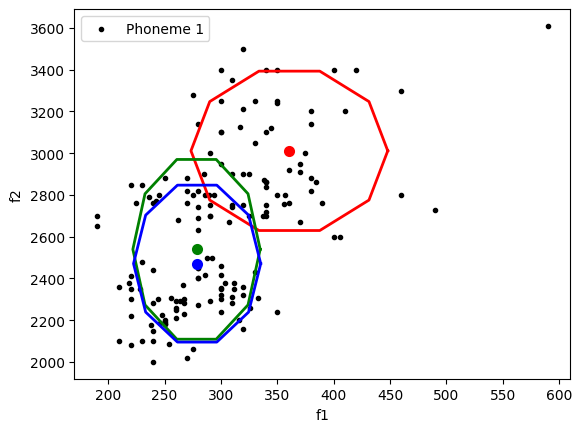

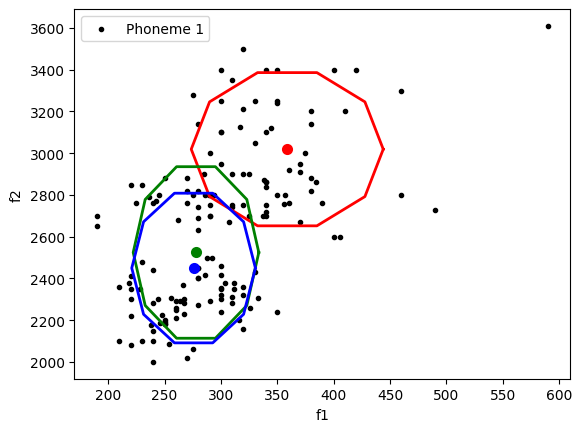

...

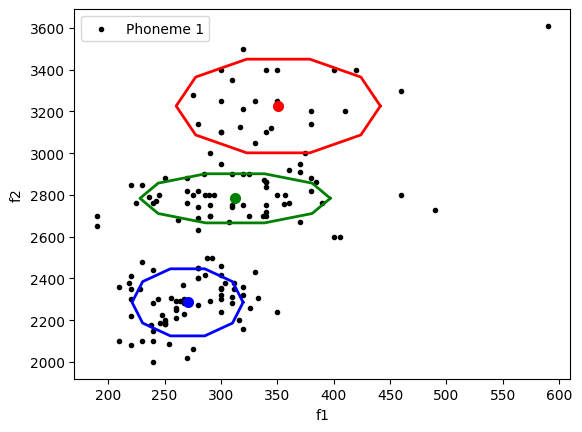

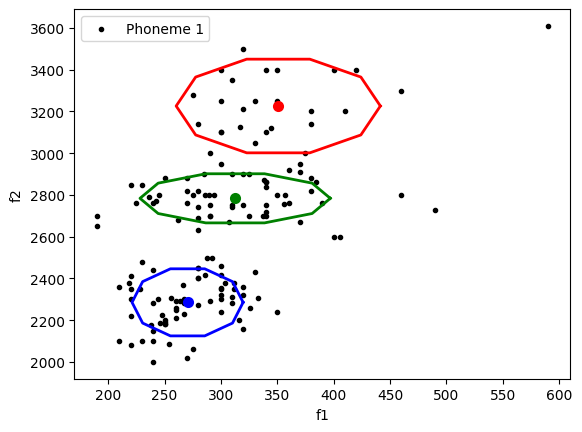

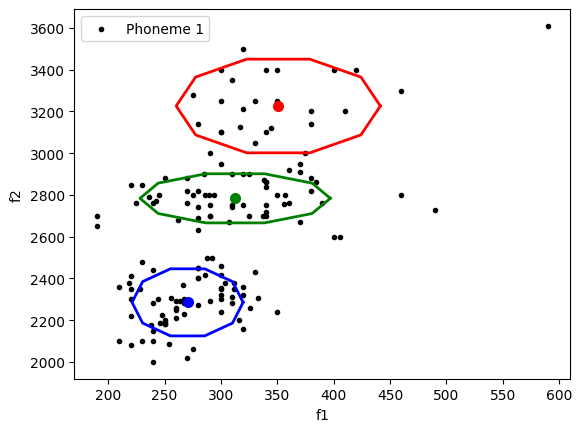

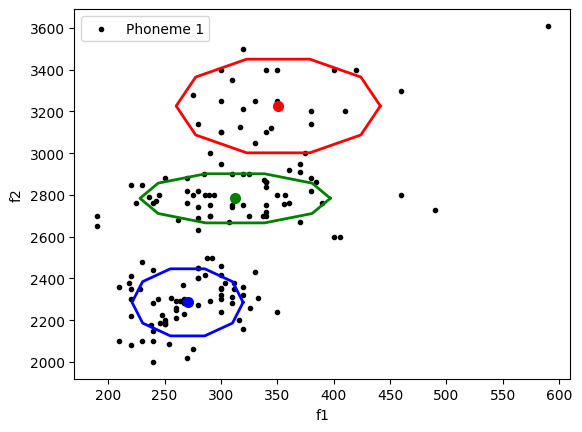

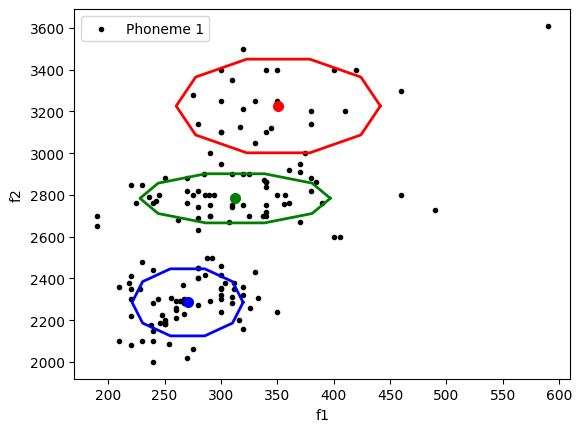

In [9]:
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print(mu, s)
save_model(mu, s, p)

### <font color="red"> We will run the code multiple times for $K=3$, We will observe the changes and include those changes in our report. We will use these figures and the printed MoG parameters to support my observations.</font>
###We will Repeat the training for phoneme_id = 2 and $K=6$ for phoneme_id =1 and phoneme_id=2.



In [10]:
## initialising k = 3 and p_id = 2 ##
k =3
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 2
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

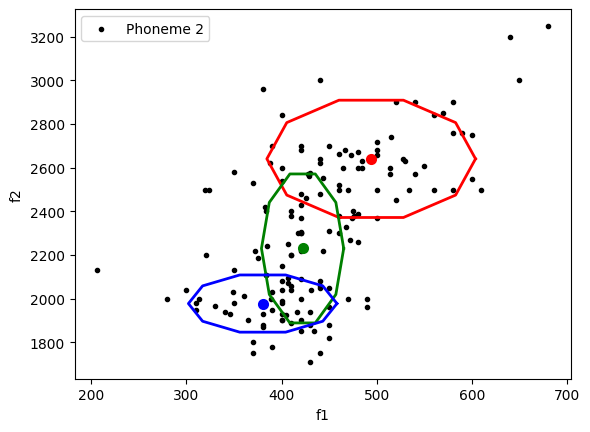


Finished.

[[ 494.15448 2640.783  ]
 [ 422.0351  2230.1306 ]
 [ 380.0905  1977.4797 ]] [[[ 6014.43606289     0.        ]
  [    0.         39942.82711029]]

 [[  934.65635502     0.        ]
  [    0.         64427.42950452]]

 [[ 3047.91454562     0.        ]
  [    0.          9496.22981505]]]


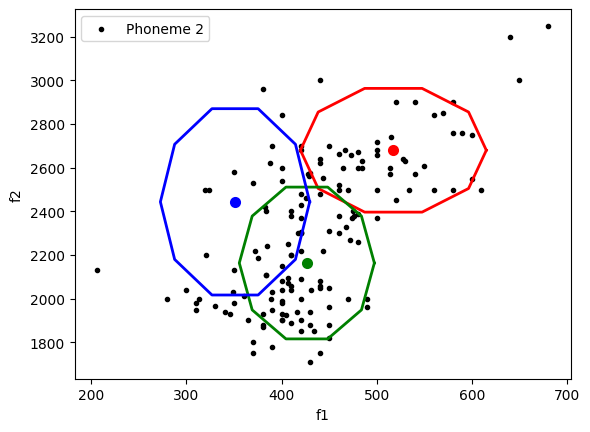

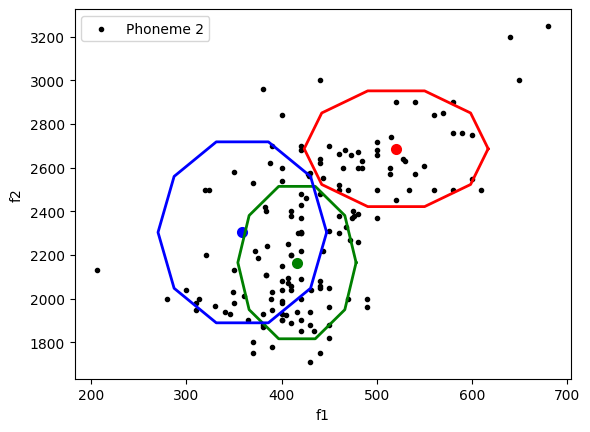

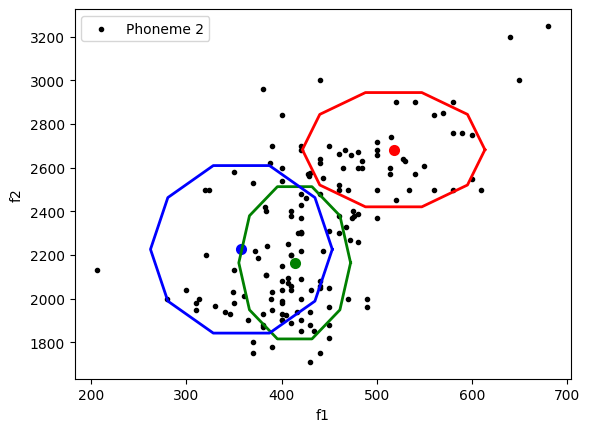

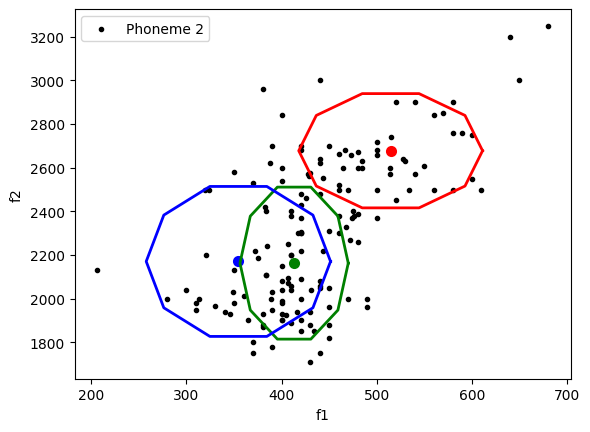

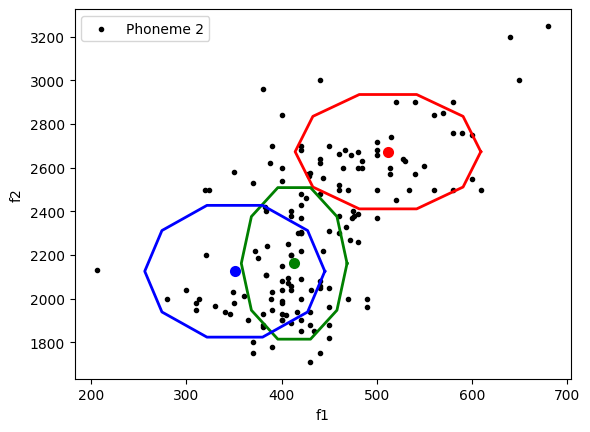

...

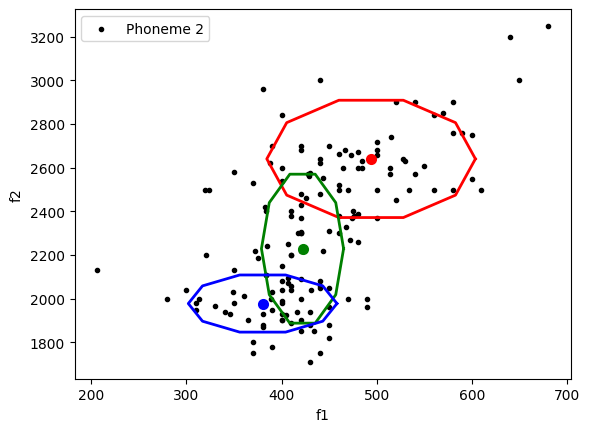

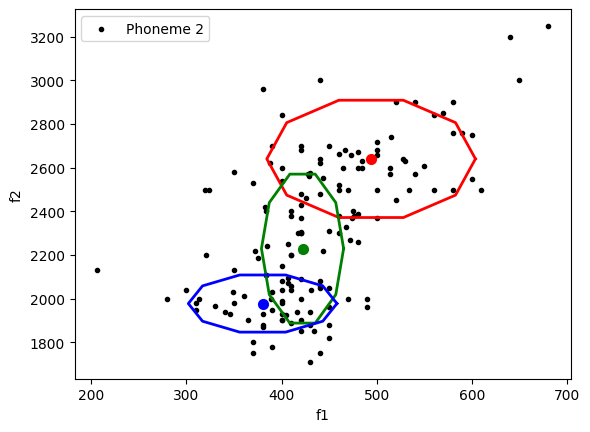

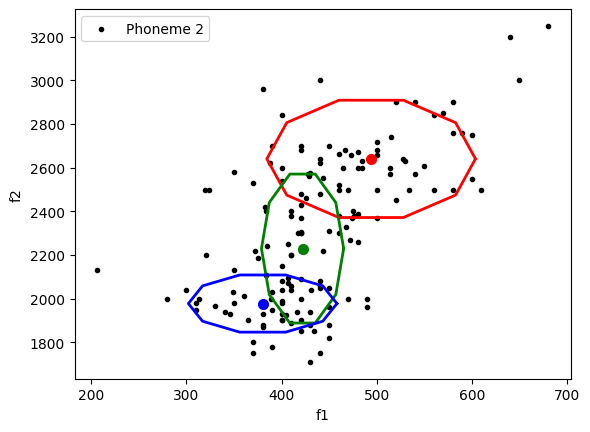

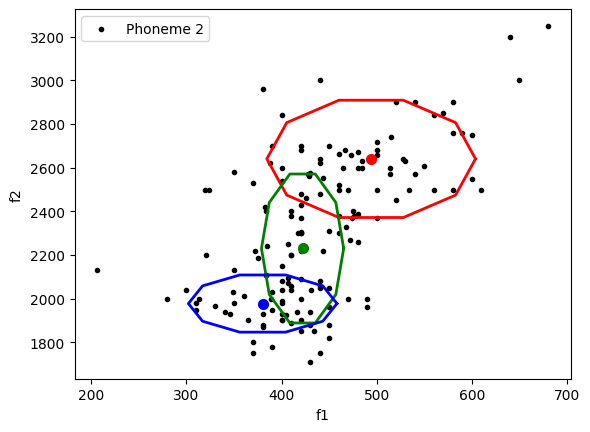

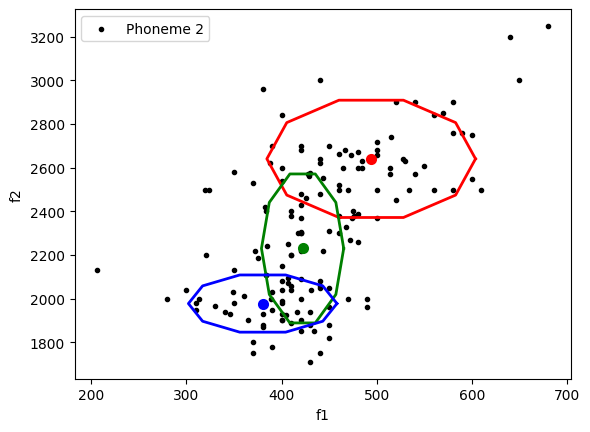

In [11]:
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print(mu, s)
save_model(mu, s, p)

In [12]:
## initialising k = 6 and p_id = 1 ##
k = 6
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 1
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

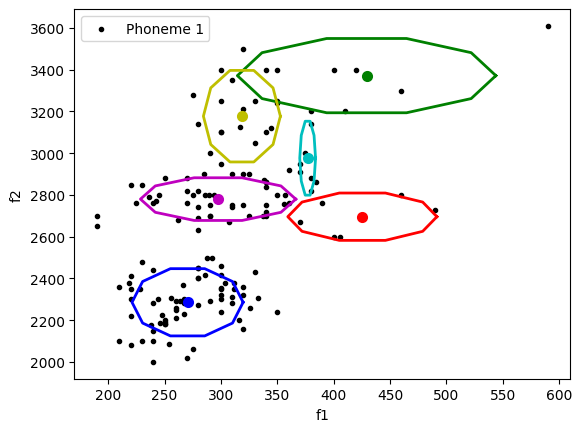


Finished.

[[ 425.44913 2695.869  ]
 [ 429.21475 3371.8022 ]
 [ 270.38586 2285.749  ]
 [ 376.91492 2976.2012 ]
 [ 297.48355 2780.1147 ]
 [ 318.58167 3177.5293 ]] [[[2.18728769e+03 0.00000000e+00]
  [0.00000000e+00 7.11244014e+03]]

 [[6.57254679e+03 0.00000000e+00]
  [0.00000000e+00 1.75033243e+04]]

 [[1.21433370e+03 0.00000000e+00]
  [0.00000000e+00 1.43460778e+04]]

 [[2.45634568e+01 0.00000000e+00]
  [0.00000000e+00 1.73253744e+04]]

 [[2.37330387e+03 0.00000000e+00]
  [0.00000000e+00 5.77928459e+03]]

 [[5.82987442e+02 0.00000000e+00]
  [0.00000000e+00 2.65980078e+04]]]


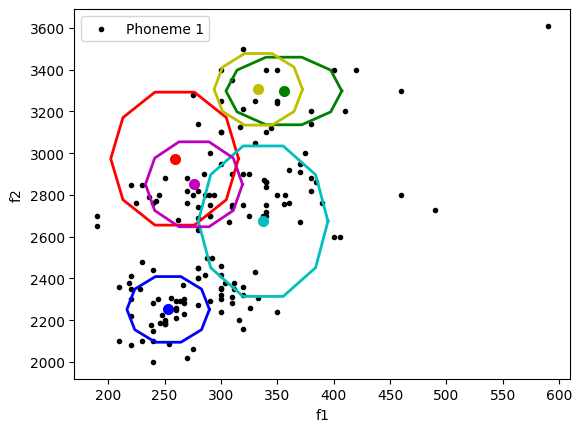

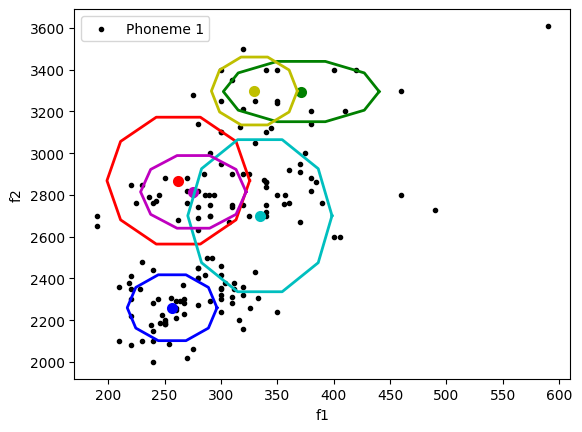

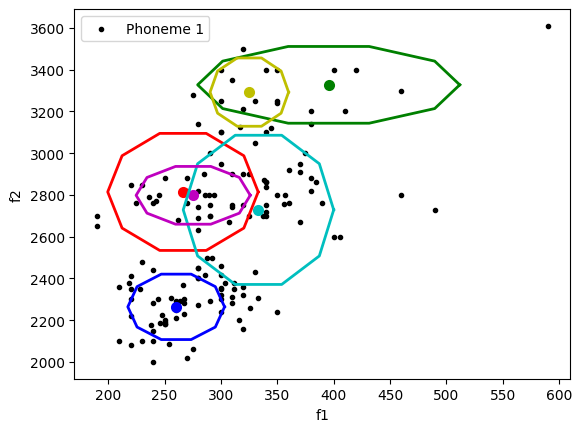

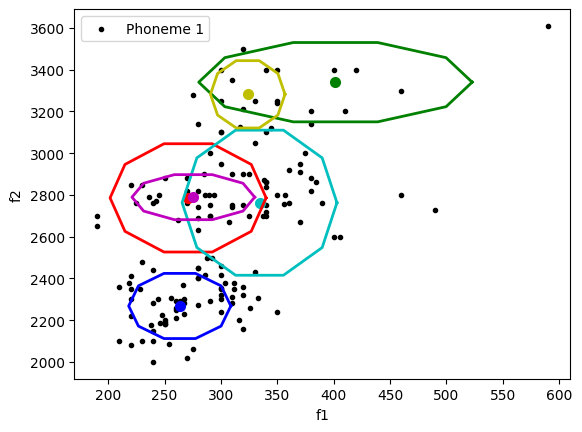

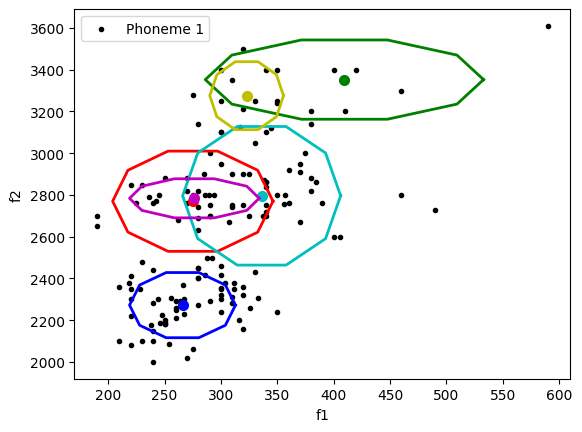

...

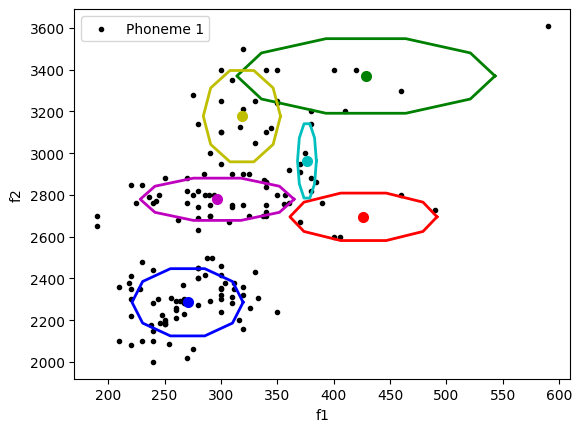

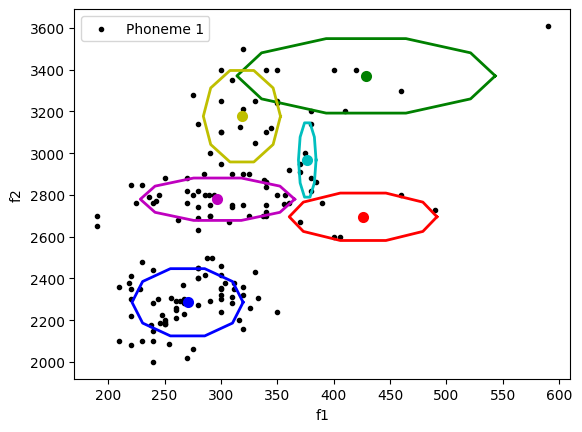

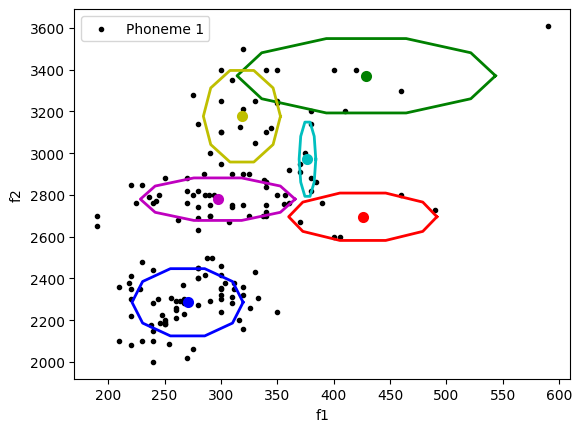

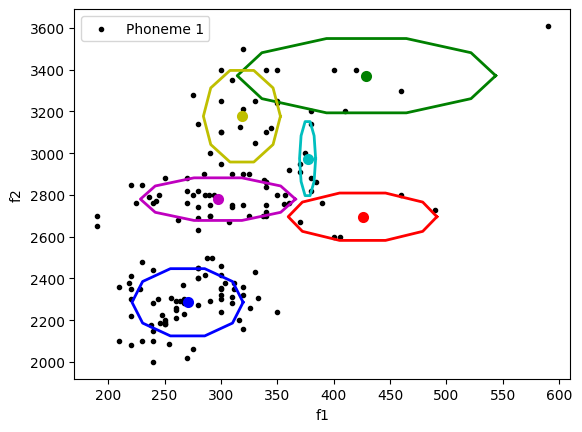

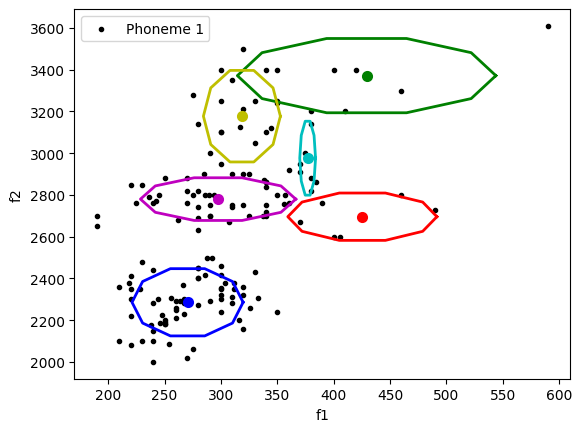

In [13]:
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print(mu, s)
save_model(mu, s, p)

In [14]:
## initialising k = 6 and p_id = 2 ##
k = 6
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 2
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

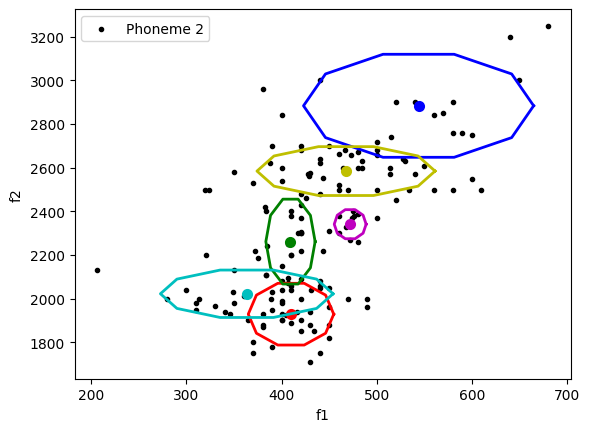


Finished.

[[ 409.86307 1928.8704 ]
 [ 409.32037 2261.5305 ]
 [ 543.96576 2883.9587 ]
 [ 363.354   2022.3805 ]
 [ 472.08026 2341.2249 ]
 [ 467.6833  2584.7039 ]] [[[ 1009.60707527     0.        ]
  [    0.         11066.8364715 ]]

 [[  335.66418767     0.        ]
  [    0.         20902.18809607]]

 [[ 7315.15020014     0.        ]
  [    0.         30805.26219573]]

 [[ 4117.83082312     0.        ]
  [    0.          6527.40318365]]

 [[  140.7086074      0.        ]
  [    0.          2452.51346037]]

 [[ 4380.46745179     0.        ]
  [    0.          6931.45521028]]]


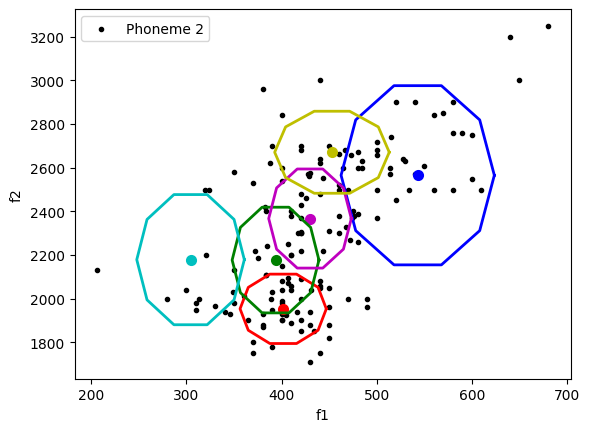

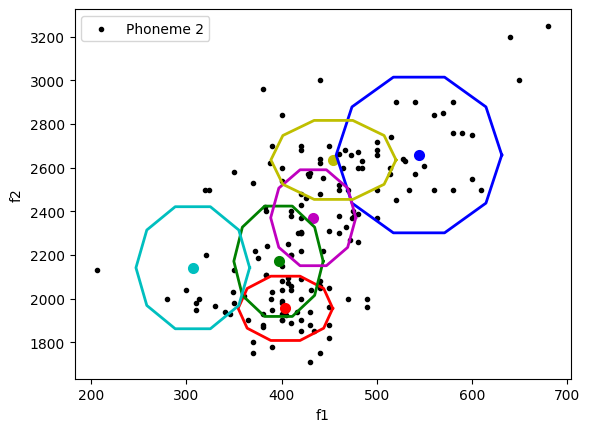

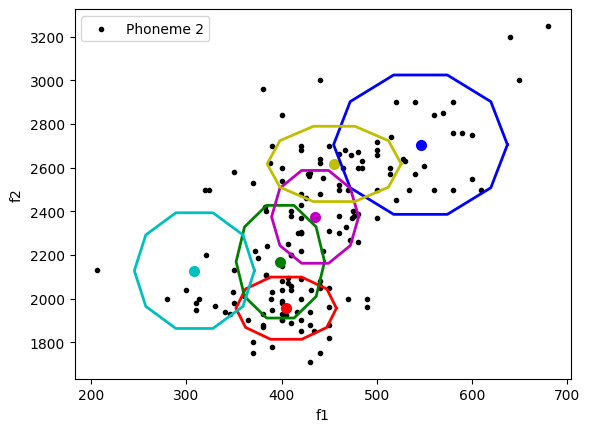

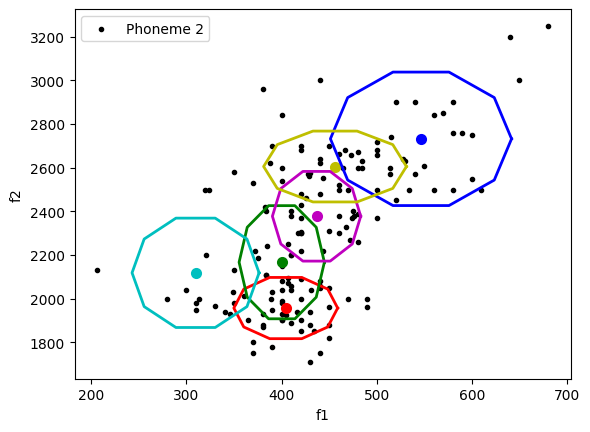

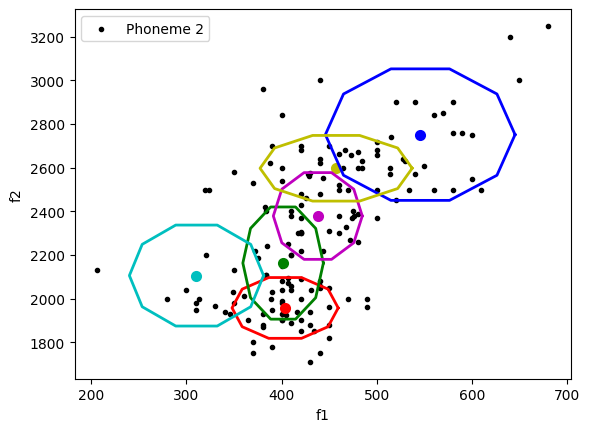

...

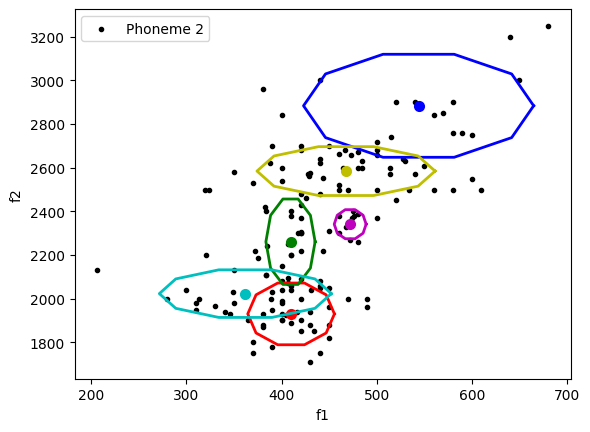

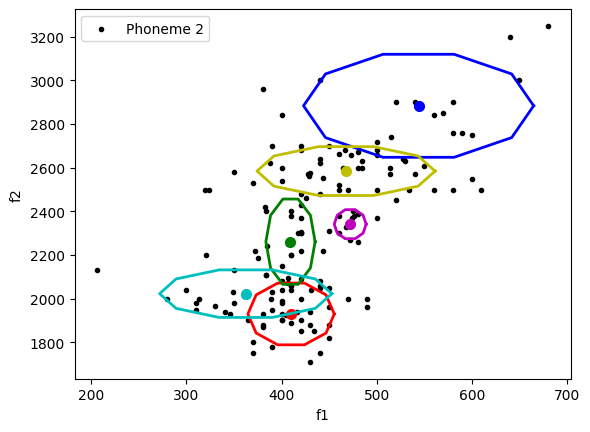

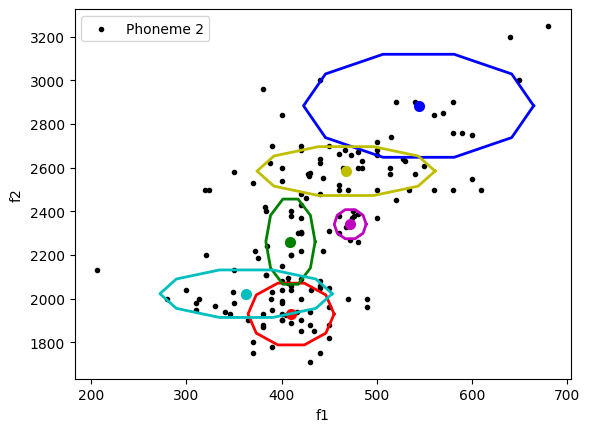

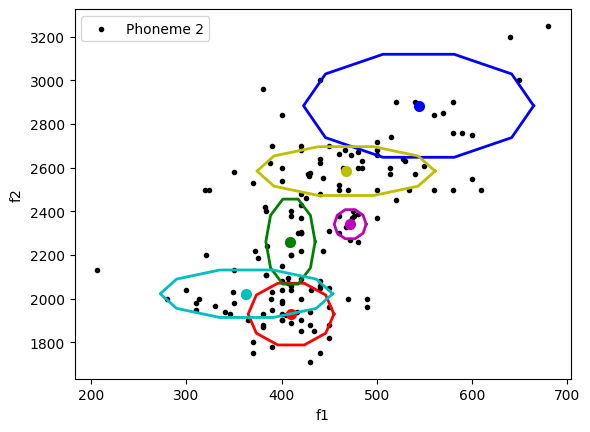

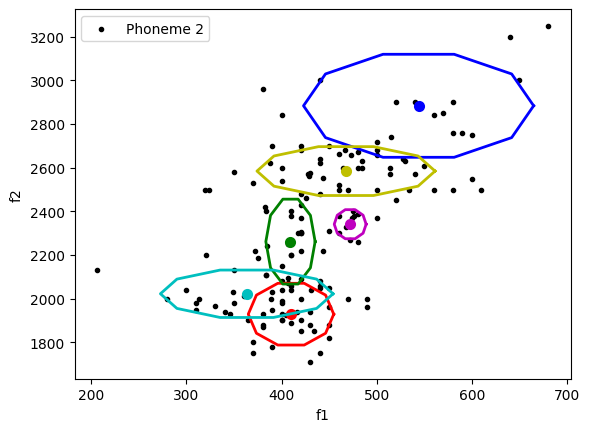

In [15]:
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100
for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)

        p[i] = np.mean(Z[:,i])

    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
print('\nFinished.\n')
print(mu, s)
save_model(mu, s, p)

### <font color="red"> Now we will use the 2 MoGs ($K=3$) learnt in above code sections to build a classifier to discriminate between phonemes 1 and 2, and i will explain the process in the report.</font>

We will classify using the Maximum Likelihood (ML) criterion and calculate the miss-classification error. Remember that a classification under the ML compares $p(\mathbf{x};\boldsymbol\theta_{1})$, where $\boldsymbol\theta_{1}$ are the parameters of the MoG learnt for the first phoneme, with $p(\mathbf{x};\boldsymbol\theta_{2})$, where $\boldsymbol\theta_{2}$  are the parameters of the MoG learnt for the second phoneme.

In [16]:
k = 3
indices_class_1 = np.where(phoneme_id==1)
indices_class_2 = np.where(phoneme_id==2)
indices_class_1 = indices_class_1[0]
indices_class_2 = indices_class_2[0]
indices_class_1_and_2 = np.concatenate((indices_class_1, indices_class_2), axis=0)

X = X_full[indices_class_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 1
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu_phoneme_1 = GMM_parameters_phoneme_1['mu']
s_phoneme_1 = GMM_parameters_phoneme_1['s']
p_phoneme_1 = GMM_parameters_phoneme_1['p']

# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_1 = np.zeros((N,k)) # shape Nxk

# get predictions
###your code here
##Computing  GMM predictions for phoneme 1
for i in range(k):
    diff = X - mu_phoneme_1[i]
    exponent = np.einsum('ij,ij->i', diff @ np.linalg.inv(s_phoneme_1[i]), diff)
    Z_phoneme_1[:, i] = p_phoneme_1[i] * np.exp(-0.5 * exponent) / np.sqrt(np.linalg.det(s_phoneme_1[i]) * (2 * np.pi) ** D)

# Probability sum of all components for phoneme 1
log_likelihood_phoneme_1 = np.sum(Z_phoneme_1, axis=1)

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 2
p_id = 2
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True).item()
else:
    raise('File {} does not exist.'.format(npy_filename))

##extracting parameters for phoneme 2
mu_phoneme_2 = GMM_parameters_phoneme_2['mu']
s_phoneme_2 = GMM_parameters_phoneme_2['s']
p_phoneme_2 = GMM_parameters_phoneme_2['p']

# Initialize array Z_phoneme_2 that will get the predictions of each Gaussian on each sample
Z_phoneme_2 = np.zeros((N, k))  # shape Nxk

##Computing GMM predictions for phoneme 2
for i in range(k):
    diff = X - mu_phoneme_2[i]
    exponent = np.einsum('ij,ij->i', diff @ np.linalg.inv(s_phoneme_2[i]), diff)
    Z_phoneme_2[:, i] = p_phoneme_2[i] * np.exp(-0.5 * exponent) / np.sqrt(np.linalg.det(s_phoneme_2[i]) * (2 * np.pi) ** D)

# Probability sum of all components for phoneme 2
log_likelihood_phoneme_2 = np.sum(Z_phoneme_2, axis=1)
# classify each point using Maximum Likelihood
predictions = np.where(log_likelihood_phoneme_1 > log_likelihood_phoneme_2, 1, 2)

# Ground truth labels
ground_truth = np.concatenate((np.ones(len(indices_class_1)), np.full(len(indices_class_2), 2)), axis=0)

# calculate accuracy
accuracy = np.sum(predictions == ground_truth) / N
error_rate = 1 - accuracy

print(f'Classification Accuracy: {accuracy * 100:.2f}%')

Classification Accuracy: 96.38%


### <font color="red"> We will repeat for $K=6$ and compare the results in terms of accuracy in our report.  </font>


In [17]:
k = 6
indices_class_1 = np.where(phoneme_id==1)
indices_class_2 = np.where(phoneme_id==2)
indices_class_1 = indices_class_1[0]
indices_class_2 = indices_class_2[0]
indices_class_1_and_2 = np.concatenate((indices_class_1, indices_class_2), axis=0)

X = X_full[indices_class_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 1
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))

##extracting parameters for phoneme 1
mu_phoneme_1 = GMM_parameters_phoneme_1['mu']
s_phoneme_1 = GMM_parameters_phoneme_1['s']
p_phoneme_1 = GMM_parameters_phoneme_1['p']

# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_1 = np.zeros((N,k)) # shape Nxk

# get predictions
###your code here
##Computing  GMM predictions for phoneme 1
for i in range(k):
    diff = X - mu_phoneme_1[i]
    exponent = np.einsum('ij,ij->i', diff @ np.linalg.inv(s_phoneme_1[i]), diff)
    Z_phoneme_1[:, i] = p_phoneme_1[i] * np.exp(-0.5 * exponent) / np.sqrt(np.linalg.det(s_phoneme_1[i]) * (2 * np.pi) ** D)

# Probability sum of all components for phoneme 1
log_likelihood_phoneme_1 = np.sum(Z_phoneme_1, axis=1)

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 2
p_id = 2
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True).item()
else:
    raise('File {} does not exist.'.format(npy_filename))

##extracting parameters for phoneme 2
mu_phoneme_2 = GMM_parameters_phoneme_2['mu']
s_phoneme_2 = GMM_parameters_phoneme_2['s']
p_phoneme_2 = GMM_parameters_phoneme_2['p']

# Initialize array Z_phoneme_2 that will get the predictions of each Gaussian on each sample
Z_phoneme_2 = np.zeros((N, k))  # shape Nxk

###Computing  GMM predictions for phoneme 2
for i in range(k):
    diff = X - mu_phoneme_2[i]
    exponent = np.einsum('ij,ij->i', diff @ np.linalg.inv(s_phoneme_2[i]), diff)
    Z_phoneme_2[:, i] = p_phoneme_2[i] * np.exp(-0.5 * exponent) / np.sqrt(np.linalg.det(s_phoneme_2[i]) * (2 * np.pi) ** D)

# Probability sum of all components for phoneme 2
log_likelihood_phoneme_2 = np.sum(Z_phoneme_2, axis=1)
# classify each point using Maximum Likelihood
predictions = np.where(log_likelihood_phoneme_1 > log_likelihood_phoneme_2, 1, 2)

# Ground truth labels
ground_truth = np.concatenate((np.ones(len(indices_class_1)), np.full(len(indices_class_2), 2)), axis=0)

# calculate accuracy
accuracy = np.sum(predictions == ground_truth) / N
error_rate = 1 - accuracy

print(f'Classification Accuracy: {accuracy * 100:.2f}%')



Classification Accuracy: 95.72%


### <font color="red"> We will display a "classification matrix" assigning labels to a grid of all combinations of the $F1$ and $F2$ features for the $K=3$ classifiers from above. Next, we will repeat this step for $K=6$ and compare the two in our report.  </font>

In particular, we will create a custom uniform grid of points that spans all possible intermediate combinations of $F1$ and $F2$ features, using the features' minimum and maximum values as the limits. We will classify each point in the grid using one of your classifiers. That is, create a classification matrix, $\mathbf{M}$, whose elements are either 0 or 1. $M(i,j)$ is 0 if the point at location $(i,j)$ on the custom grid is classified as belonging to phoneme 1, and is 1 otherwise.

### Hint: building the custom grid:
Assuming our data were the orange points below, the custom grid would look something like the following (evenly spaced points spanning the minimum to maximum values of both features):

![](https://i.imgur.com/khfYx42.png)



f1 range: 190-680 | 490 points
f2 range: 1710-3610 | 1900 points


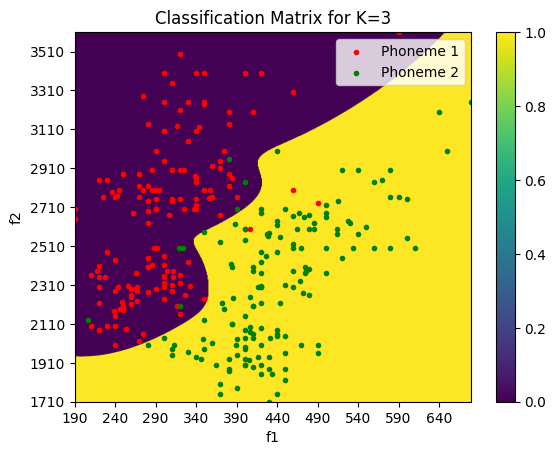

In [18]:
k = 3

X = X_full[indices_class_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

min_f1 = int(np.min(X[:,0]))
max_f1 = int(np.max(X[:,0]))
min_f2 = int(np.min(X[:,1]))
max_f2 = int(np.max(X[:,1]))
N_f1 = max_f1 - min_f1
N_f2 = max_f2 - min_f2
print('f1 range: {}-{} | {} points'.format(min_f1, max_f1, N_f1))
print('f2 range: {}-{} | {} points'.format(min_f2, max_f2, N_f2))

#########################################

# Create a custom grid of shape N_f1 x N_f2
# The grid will span all the values of (f1, f2) pairs, between [min_f1, max_f1] on f1 axis, and between [min_f2, max_f2] on f2 axis
# Then, classify each point [i.e., each (f1, f2) pair] of that grid, to either phoneme 1, or phoneme 2, using the two trained GMMs
# Do predictions, using GMM trained on phoneme 1, on custom grid
# Do predictions, using GMM trained on phoneme 2, on custom grid
# Compare these predictions, to classify each point of the grid
# Store these prediction in a 2D numpy array named "M", of shape N_f2 x N_f1 (the first dimension is f2 so that we keep f2 in the vertical axis of the plot)
# M should contain "0.0" in the points that belong to phoneme 1 and "1.0" in the points that belong to phoneme 2
########################################/

##creating a grid
grid_f1, grid_f2 = np.meshgrid(np.linspace(min_f1, max_f1, N_f1),
                                np.linspace(min_f2, max_f2, N_f2))

##combining grid points into a 2d array
grid_points = np.vstack([grid_f1.ravel(), grid_f2.ravel()]).T

#Intitialize classification matrix
M = np.zeros((N_f2, N_f1))

# Load GMM parameters for phoneme 1
p_id = 1
npy_filename = f'data/GMM_params_phoneme_{p_id:02}_k_{k:02}.npy'
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise Exception(f'File {npy_filename} does not exist.')

# Extracting GMM parameters for phoneme 1
mu_phoneme_1 = GMM_parameters_phoneme_1['mu']
s_phoneme_1 = GMM_parameters_phoneme_1['s']
p_phoneme_1 = GMM_parameters_phoneme_1['p']

# Get predictions for phoneme 1 on the custom grid
Z_phoneme_1 = get_predictions(mu_phoneme_1, s_phoneme_1, p_phoneme_1, grid_points)

# Load GMM parameters for phoneme 2
p_id = 2
npy_filename = f'data/GMM_params_phoneme_{p_id:02}_k_{k:02}.npy'
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
else:
    raise Exception(f'File {npy_filename} does not exist.')

# Extracting GMM parameters for phoneme 2
mu_phoneme_2 = GMM_parameters_phoneme_2['mu']
s_phoneme_2 = GMM_parameters_phoneme_2['s']
p_phoneme_2 = GMM_parameters_phoneme_2['p']

# Get predictions for phoneme 2 on the custom grid
Z_phoneme_2 = get_predictions(mu_phoneme_2, s_phoneme_2, p_phoneme_2, grid_points)

# Compare the predictions and classify each grid point
likelihood_phoneme_1 = np.sum(Z_phoneme_1, axis=1)
likelihood_phoneme_2 = np.sum(Z_phoneme_2, axis=1)

# Classify each point: if likelihood_phoneme_1 > likelihood_phoneme_2, classify as phoneme 1 (0.0), otherwise phoneme 2 (1.0)
predicted_labels = np.where(likelihood_phoneme_1 > likelihood_phoneme_2, 0.0, 1.0)

# Reshape predicted labels into a 2D array for the custom grid (N_f2 x N_f1)
M = predicted_labels.reshape(N_f2, N_f1)

################################################
# Visualize predictions on custom grid

# Create a figure
#fig = plt.figure()
fig, ax = plt.subplots()

# use aspect='auto' (default is 'equal'), to force the plotted image to be square, when dimensions are unequal
plt.imshow(M, aspect='auto')

# set label of x axis
ax.set_xlabel('f1')
# set label of y axis
ax.set_ylabel('f2')

# set limits of axes
plt.xlim((0, N_f1))
plt.ylim((0, N_f2))

# set range and strings of ticks on axes
x_range = np.arange(0, N_f1, step=50)
x_strings = [str(x+min_f1) for x in x_range]
plt.xticks(x_range, x_strings)
y_range = np.arange(0, N_f2, step=200)
y_strings = [str(y+min_f2) for y in y_range]
plt.yticks(y_range, y_strings)

# set title of figure
title_string = 'Classification Matrix for K=3'
plt.title(title_string)

# add a colorbar
plt.colorbar()

N_samples = int(X.shape[0]/2)
plt.scatter(X[:N_samples, 0] - min_f1, X[:N_samples, 1] - min_f2, marker='.', color='red', label='Phoneme 1')
plt.scatter(X[N_samples:, 0] - min_f1, X[N_samples:, 1] - min_f2, marker='.', color='green', label='Phoneme 2')

# add legend to the subplot
plt.legend()
plt.show()

f1 range: 190-680 | 490 points
f2 range: 1710-3610 | 1900 points


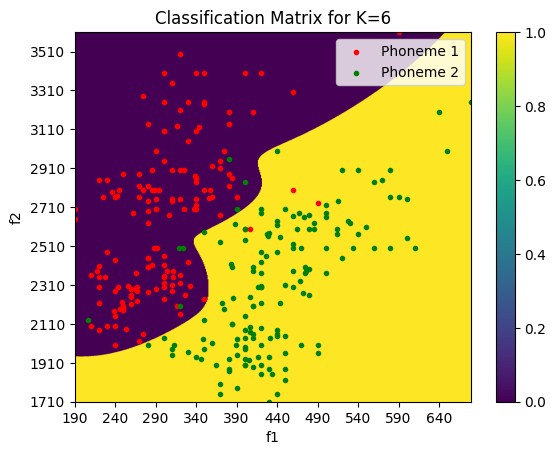

In [19]:
k = 6

X = X_full[indices_class_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

min_f1 = int(np.min(X[:,0]))
max_f1 = int(np.max(X[:,0]))
min_f2 = int(np.min(X[:,1]))
max_f2 = int(np.max(X[:,1]))
N_f1 = max_f1 - min_f1
N_f2 = max_f2 - min_f2
print('f1 range: {}-{} | {} points'.format(min_f1, max_f1, N_f1))
print('f2 range: {}-{} | {} points'.format(min_f2, max_f2, N_f2))

#########################################
# Write your code here

# Create a custom grid of shape N_f1 x N_f2
# The grid will span all the values of (f1, f2) pairs, between [min_f1, max_f1] on f1 axis, and between [min_f2, max_f2] on f2 axis
# Then, classify each point [i.e., each (f1, f2) pair] of that grid, to either phoneme 1, or phoneme 2, using the two trained GMMs
# Do predictions, using GMM trained on phoneme 1, on custom grid
# Do predictions, using GMM trained on phoneme 2, on custom grid
# Compare these predictions, to classify each point of the grid
# Store these prediction in a 2D numpy array named "M", of shape N_f2 x N_f1 (the first dimension is f2 so that we keep f2 in the vertical axis of the plot)
# M should contain "0.0" in the points that belong to phoneme 1 and "1.0" in the points that belong to phoneme 2
########################################/

##creating a grid
grid_f1, grid_f2 = np.meshgrid(np.linspace(min_f1, max_f1, N_f1),
                                np.linspace(min_f2, max_f2, N_f2))

##combining grid points into a 2d array
grid_points = np.vstack([grid_f1.ravel(), grid_f2.ravel()]).T

#Intitialize classification matrix
M = np.zeros((N_f2, N_f1))

# Load GMM parameters for phoneme 1
p_id = 1
npy_filename = f'data/GMM_params_phoneme_{p_id:02}_k_{k:02}.npy'
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise Exception(f'File {npy_filename} does not exist.')

# Extracting GMM parameters for phoneme 1
mu_phoneme_1 = GMM_parameters_phoneme_1['mu']
s_phoneme_1 = GMM_parameters_phoneme_1['s']
p_phoneme_1 = GMM_parameters_phoneme_1['p']

# Get predictions for phoneme 1 on the custom grid
Z_phoneme_1 = get_predictions(mu_phoneme_1, s_phoneme_1, p_phoneme_1, grid_points)

# Load GMM parameters for phoneme 2
p_id = 2
npy_filename = f'data/GMM_params_phoneme_{p_id:02}_k_{k:02}.npy'
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_2 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
else:
    raise Exception(f'File {npy_filename} does not exist.')

# Extracting GMM parameters for phoneme 2
mu_phoneme_2 = GMM_parameters_phoneme_2['mu']
s_phoneme_2 = GMM_parameters_phoneme_2['s']
p_phoneme_2 = GMM_parameters_phoneme_2['p']

# Get predictions for phoneme 2 on the custom grid
Z_phoneme_2 = get_predictions(mu_phoneme_2, s_phoneme_2, p_phoneme_2, grid_points)

# Compare the predictions and classify each grid point
likelihood_1 = np.sum(Z_phoneme_1, axis=1)
likelihood_2 = np.sum(Z_phoneme_2, axis=1)

# Classify each point: if likelihood_phoneme_1 > likelihood_phoneme_2, classify as phoneme 1 (0.0), otherwise phoneme 2 (1.0)
predicted_labels = np.where(likelihood_phoneme_1 > likelihood_phoneme_2, 0.0, 1.0)

# Reshape predicted labels into a 2D array for the custom grid (N_f2 x N_f1)
M = predicted_labels.reshape(N_f2, N_f1)

################################################
# Visualize predictions on custom grid

# Create a figure
#fig = plt.figure()
fig, ax = plt.subplots()

# use aspect='auto' (default is 'equal'), to force the plotted image to be square, when dimensions are unequal
plt.imshow(M, aspect='auto')

# set label of x axis
ax.set_xlabel('f1')
# set label of y axis
ax.set_ylabel('f2')

# set limits of axes
plt.xlim((0, N_f1))
plt.ylim((0, N_f2))

# set range and strings of ticks on axes
x_range = np.arange(0, N_f1, step=50)
x_strings = [str(x+min_f1) for x in x_range]
plt.xticks(x_range, x_strings)
y_range = np.arange(0, N_f2, step=200)
y_strings = [str(y+min_f2) for y in y_range]
plt.yticks(y_range, y_strings)

# set title of figure
title_string = 'Classification Matrix for K=6'
plt.title(title_string)

# add a colorbar
plt.colorbar()

N_samples = int(X.shape[0]/2)
plt.scatter(X[:N_samples, 0] - min_f1, X[:N_samples, 1] - min_f2, marker='.', color='red', label='Phoneme 1')
plt.scatter(X[N_samples:, 0] - min_f1, X[N_samples:, 1] - min_f2, marker='.', color='green', label='Phoneme 2')

# add legend to the subplot
plt.legend()
plt.show()

We will create a new dataset that will contain 3 columns, as follows:
\begin{equation}
    X = [F1, F2, F1+F2]
\end{equation}

### <font color="red"> We will try to fit a MoG model to the new data. There is a problem that i have observed and i have explained it in my report why it occurs.

Iteration 001/150
Iteration 002/150
Iteration 003/150
Iteration 004/150
Iteration 005/150


<ipython-input-6-497514ad426e>:26: RuntimeWarning: divide by zero encountered in scalar divide
  Z[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))


ValueError: Input contains infinity or a value too large for dtype('float64').

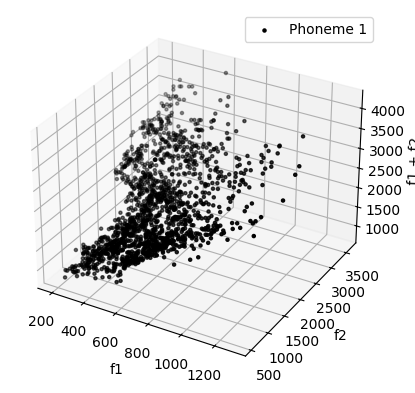

In [20]:
p_id = 1 # id of the phoneme that will be used (e.g. 1, or 2)

k = 3 # number of GMM components
X = np.zeros((len(f1), 3))
#########################################
# Write your code here
# The shape of X is be two-dimensional. Each row will represent a sample of the dataset, and each column will represent a feature (e.g. f1 or f2 or f1+f2)
# Store f1 in the first column of X, f2 in the second column of X and f1+f2 in the third column of X
# Filter X to, contain only samples that belong to the chosen phoneme.

##First Feature
feature_1 = X_full[:, 0]
##Second Feature
feature_2 = X_full[:, 1]
##Combining features into the matrix
X = np.column_stack((feature_1, feature_2, feature_1 + feature_2))

#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X, title_string=title_string, ax=ax1)

N, D = X.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)

        term_1 = X.transpose() - mu_i_repeated
        term_2 = np.repeat(np.expand_dims(Z[:,i], axis=1), D, axis=1) * term_1.transpose()
        s[i,:,:] = np.matmul(term_1, term_2)/np.sum(Z[:,i])
        p[i] = np.mean(Z[:,i])

plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
plt.show()

### <font color="red"> In this section we are looking for ways of overcoming the singularity problem and implement one of them. We will show training outputs in the report. </font>

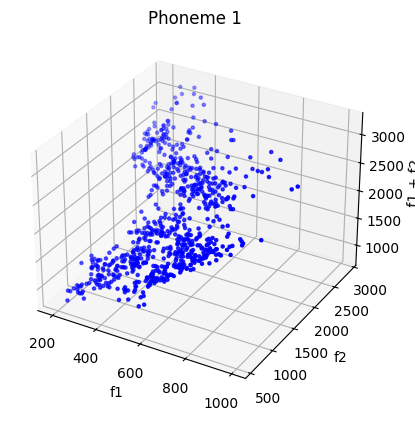

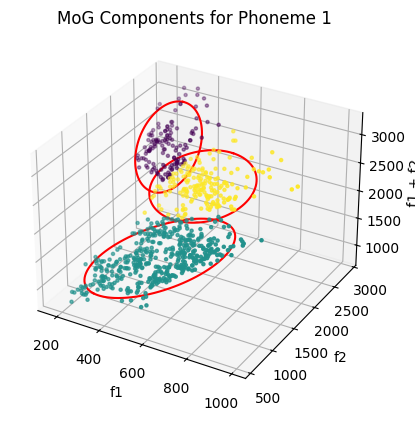

In [21]:
from sklearn.mixture import GaussianMixture
# Regularizing of parameter
regularization_param = 1e-6

# Create the new dataset X with three columns: f1, f2, and f1 + f2
X = np.zeros((len(f1), 3))
#First Feature
X[:, 0] = f1
#Second Feature
X[:, 1] = f2
#Third Feature- f1 + f2
X[:, 2] = f1 + f2

# Filter X to contain only samples for the chosen phoneme (p_id)
total_samples = len(f1)
if p_id == 1:
    X = X[:total_samples//2, :]
else:
    X = X[total_samples//2:, :]

# Plotting the 3D data
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)

# Scatter plot in 3D space
ax1.scatter(X[:, 0], X[:, 1], X[:, 2], c='b', marker='.')
ax1.set_xlabel('f1')
ax1.set_ylabel('f2')
ax1.set_zlabel('f1 + f2')
ax1.set_title(title_string)
plt.show()

k = 3  # Number of components for the Gaussian Mixture Model
gmm = GaussianMixture(n_components=k, covariance_type='full', max_iter=150)

gmm.fit(X)

# Manually regularize the covariance matrix (adding regularization_param to the diagonal)
for i in range(k):
    cov_matrix = gmm.covariances_[i]
    cov_matrix += np.eye(cov_matrix.shape[0]) * regularization_param
    gmm.covariances_[i] = cov_matrix

# Get the predicted labels and plot the GMM
Label = gmm.predict(X)

# Plot the GMM components in 3D
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'MoG Components for Phoneme {}'.format(p_id)

# Scatter plot with GMM components
ax1.scatter(X[:, 0], X[:, 1], X[:, 2], c=Label, cmap='viridis', marker='.')
ax1.set_xlabel('f1')
ax1.set_ylabel('f2')
ax1.set_zlabel('f1 + f2')
ax1.set_title(title_string)

# Plot the GMM components (mean and covariance ellipses)
for i in range(k):
    Mean_func = gmm.means_[i]
    cov = gmm.covariances_[i]

    eigvals, eigvecs = np.linalg.eigh(cov)
    order = eigvals.argsort()[::-1]
    eigvals, eigvecs = eigvals[order], eigvecs[:, order]

    # Ellipse axes lengths
    axis_lengths = 2.0 * np.sqrt(eigvals)

    # Creation of the ellipse
    u = np.linspace(0, 2 * np.pi, 100)
    ellipsex_axis = Mean_func[0] + axis_lengths[0] * np.cos(u) * eigvecs[0, 0] + axis_lengths[1] * np.sin(u) * eigvecs[0, 1]
    ellipsey_axis = Mean_func[1] + axis_lengths[0] * np.cos(u) * eigvecs[1, 0] + axis_lengths[1] * np.sin(u) * eigvecs[1, 1]
    ellipsez_axis = Mean_func[2] + axis_lengths[0] * np.cos(u) * eigvecs[2, 0] + axis_lengths[1] * np.sin(u) * eigvecs[2, 1]

    ax1.plot(ellipsex_axis, ellipsey_axis, ellipsez_axis, c='r')

plt.show()
